In [80]:
import numpy as np
import pandas as pd
import seaborn as sns
%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt
from sklearn.neighbors import NearestNeighbors, KNeighborsClassifier
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn import datasets
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import LogisticRegression
import warnings
from warnings import simplefilter
simplefilter(action='ignore', category=FutureWarning)
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import cross_val_score
from sklearn import svm, metrics
from sklearn.svm import SVC
from sklearn.feature_selection import SelectKBest, chi2
from sklearn.feature_selection import SelectPercentile
from sklearn.feature_selection import f_classif
from sklearn.metrics import recall_score
from sklearn.model_selection import validation_curve
from sklearn.linear_model import Ridge
from sklearn.preprocessing import RobustScaler
from mpl_toolkits.mplot3d import Axes3D
from sklearn.preprocessing import RobustScaler
from sklearn import preprocessing
from sklearn.preprocessing import MinMaxScaler
from xgboost import XGBClassifier
from sklearn.metrics import precision_score
import numpy as np
from itertools import cycle
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier
from scipy import interp
from sklearn.metrics import roc_auc_score
from sklearn.metrics import accuracy_score, f1_score, fbeta_score, make_scorer
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.model_selection import StratifiedKFold

# Introduction

Computational sciences and data analytics is only as useful as the data being analyzed.  Breast cancer is one of the most common cancer types, and as such, it is frequently studied at all levels.  The “Breast Cancer Wisconsin (Diagnostic) Dataset” as a very interesting and worthwhile dataset to analyze.  The data was collected by digitizing an image taken from the fine needle aspirate (FNA) of a breast mass.  The features were then identified in these images that describe the characteristics of the cell nuclei visible in the image.  In order to compute these features a separating plane was utilized, obtained from using Multi Surface Method-Tree (MSM-T) which is a classification method using linear programming to construct a decision tree.  The relevant features were then selected using an exhaustive search algorithm in the space of 1-4 features and 1-3 separating planes.  There are 569 instances (or images) in the dataset and each one has 10 features each divided into 3 subsets (['radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean', 'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se', 'fractal_dimension_se', 'radius_worst', 'texture_worst', 'perimeter_worst', 'area_worst', 'smoothness_worst', 'compactness_worst', 'concavity_worst', 'concave points_worst', 'symmetry_worst', 'fractal_dimension_worst''], se represents standard error).  Each image had its own unique ID number and the output was a diagnosis of either malignant (M) or benign (B).

# Problem - Aim 

Analysis and eventual treatment of breast cancer patients is dependent on the actual diagnosis of the cancer type.  The treatment of a patient with malignant breast cancer is far different from an individual diagnosed with benign breast cancer.  Diagnosis of any form of ailment to the human body can be difficult and prone to errors and it is often seen in hospitals that patients are receiving much more drastic treatment than is actually necessary due to doubts in diagnosis leading to a desire to treat more intensely (aka, better to air on the side of caution).  As such, it is important to correctly classify data as malignant or benign using the minimal amount of features.  Also, if there is any misclassification there must be a very low or zero false positive rate because if misclassification is observed, it is better for a benign tumor to be classified as malignant rather than vice versa.  Because swelling, skin dimpling, and scaliness of the skin are indicators of breast cancer, I hypothesize that radius, concavity, and smoothness will be important for diagnosis classifications.

# Importing Data and Preprocessing

In [81]:
#Loading the data 
data = pd.read_csv('breast.csv')
data.head(5)

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


In [82]:
#Checking the nulls
data.isna().sum()

id                           0
diagnosis                    0
radius_mean                  0
texture_mean                 0
perimeter_mean               0
area_mean                    0
smoothness_mean              0
compactness_mean             0
concavity_mean               0
concave points_mean          0
symmetry_mean                0
fractal_dimension_mean       0
radius_se                    0
texture_se                   0
perimeter_se                 0
area_se                      0
smoothness_se                0
compactness_se               0
concavity_se                 0
concave points_se            0
symmetry_se                  0
fractal_dimension_se         0
radius_worst                 0
texture_worst                0
perimeter_worst              0
area_worst                   0
smoothness_worst             0
compactness_worst            0
concavity_worst              0
concave points_worst         0
symmetry_worst               0
fractal_dimension_worst      0
Unnamed:

### No null valuable except the column 'Unnamed:32', so we removed 'Unnamed:32', 'id' and our label column 'diagnosis'. Since our labels are categorical, we used LabelEncoder to convert the categorical values to numerical values. With LabelEncoder, malignant (M) will be 1 and benign (B) will be 0.

In [83]:
#Creating X and Y 
X = data.drop(['diagnosis', 'Unnamed: 32', 'id'],axis=1)
Y = data['diagnosis']

#converting  M=1 , B=0
Y = LabelEncoder().fit_transform(Y)

# Data Visualization

### Began by viewing the diagnosis outputs for the data, as can be seen below. This is an unbalanced dataset with more benign diagnosis than malignant. 

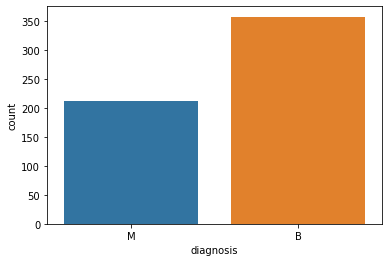

In [84]:
sns.countplot(x="diagnosis", data=data)

### View the distributions of the dataset in pairwise plots.  The diagonal axis contains plots demonstrating the univariate distribution of the data for those features.  These plots show a variety of distributions however we do see many of the features are normally distributed or left skewed.  This could lead to the possibility of the left-skewed features possibly leading towards a malignant diagnosis.   

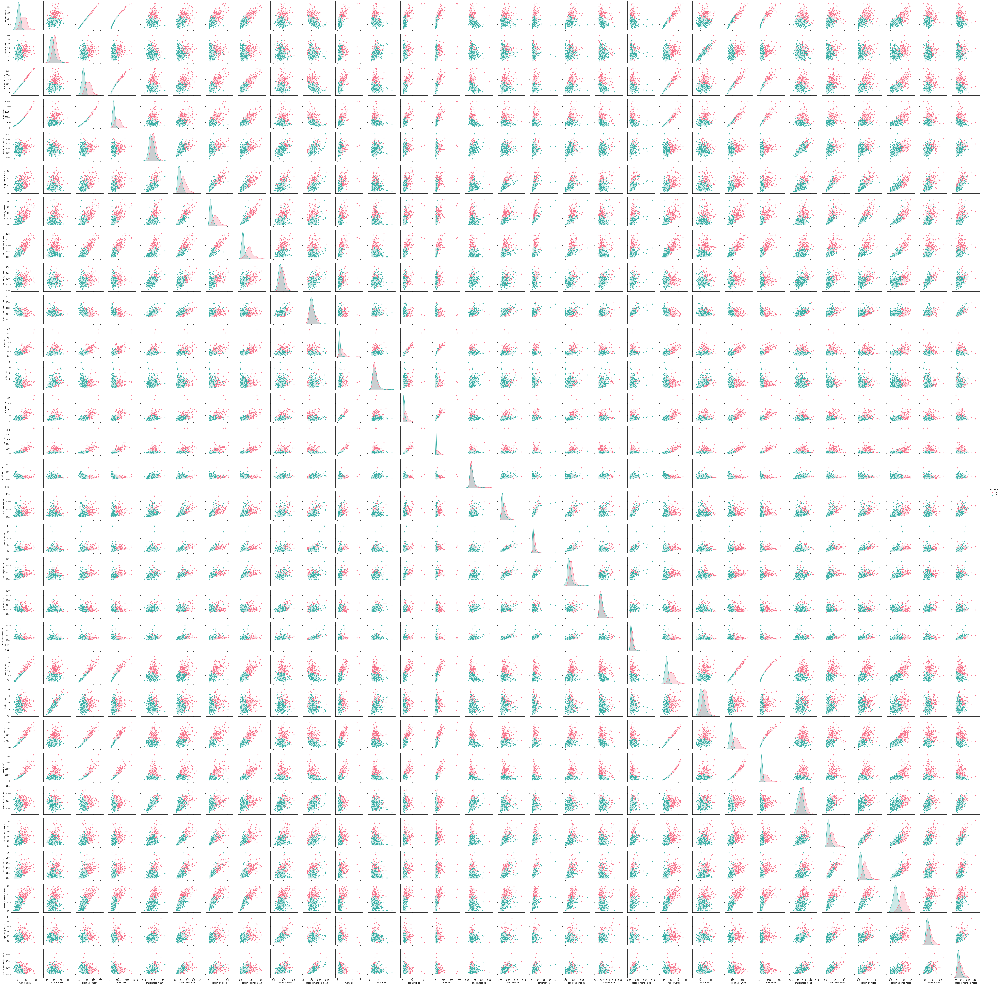

In [85]:
sns.pairplot(data, hue='diagnosis', vars=X, palette='husl')

### For better observation, we separated our training data into 'mean', 'SE', and 'worst' feature groups and we plotted the distributions of each of them.

In [86]:
X_mean = X[['radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean',
       'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean']]
X_se = X[['radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se']]
X_worst = X[['radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst']]

## 'Mean' Feature Pairwise Plot

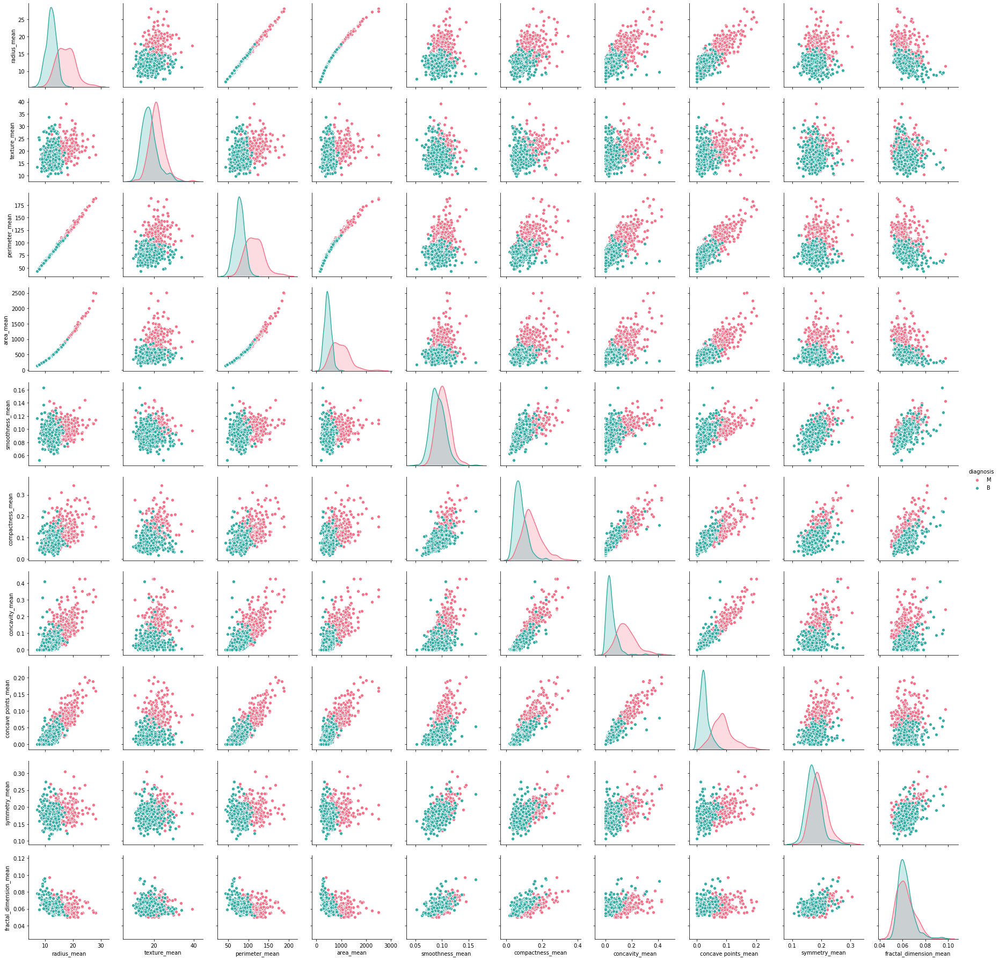

In [87]:
sns.pairplot(data, hue='diagnosis', vars=X_mean, palette='husl')

## 'SE' Feature Pairwise Plot

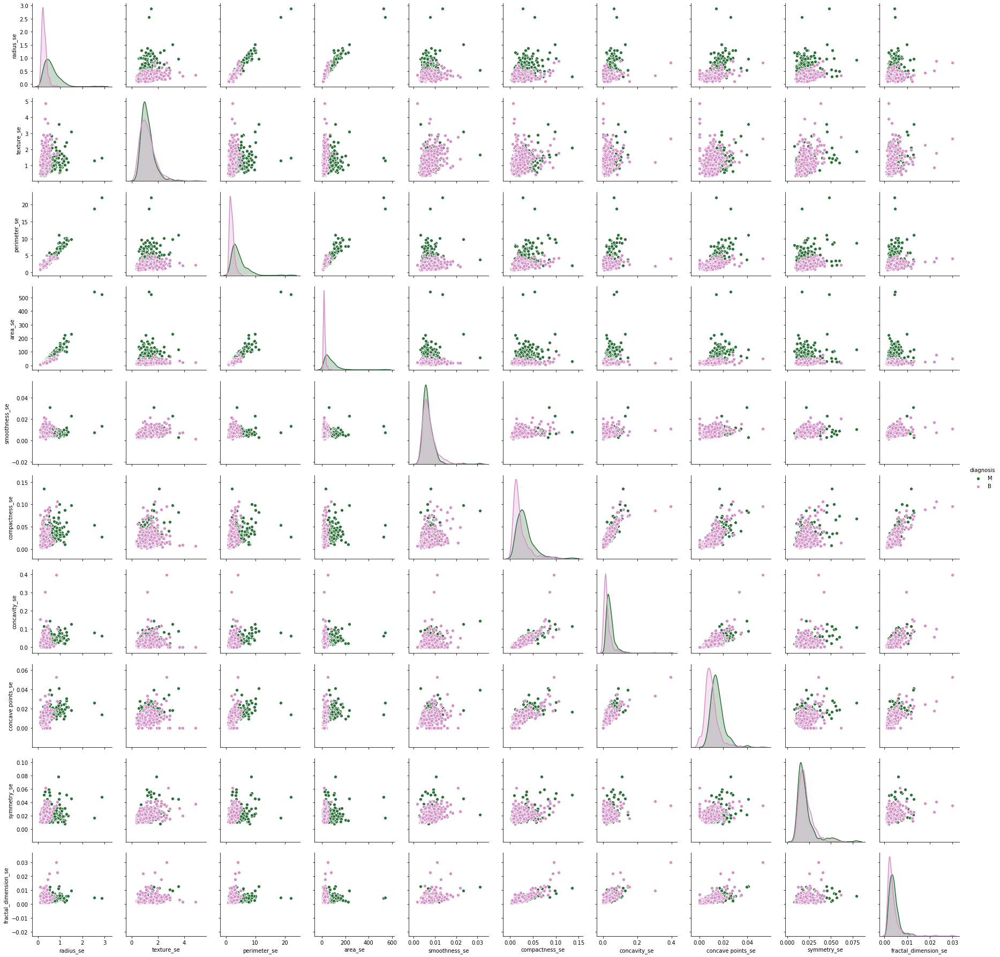

In [88]:
sns.pairplot(data, hue='diagnosis', vars=X_se, palette='cubehelix')

## 'Worst' Feature Pairwise Plot

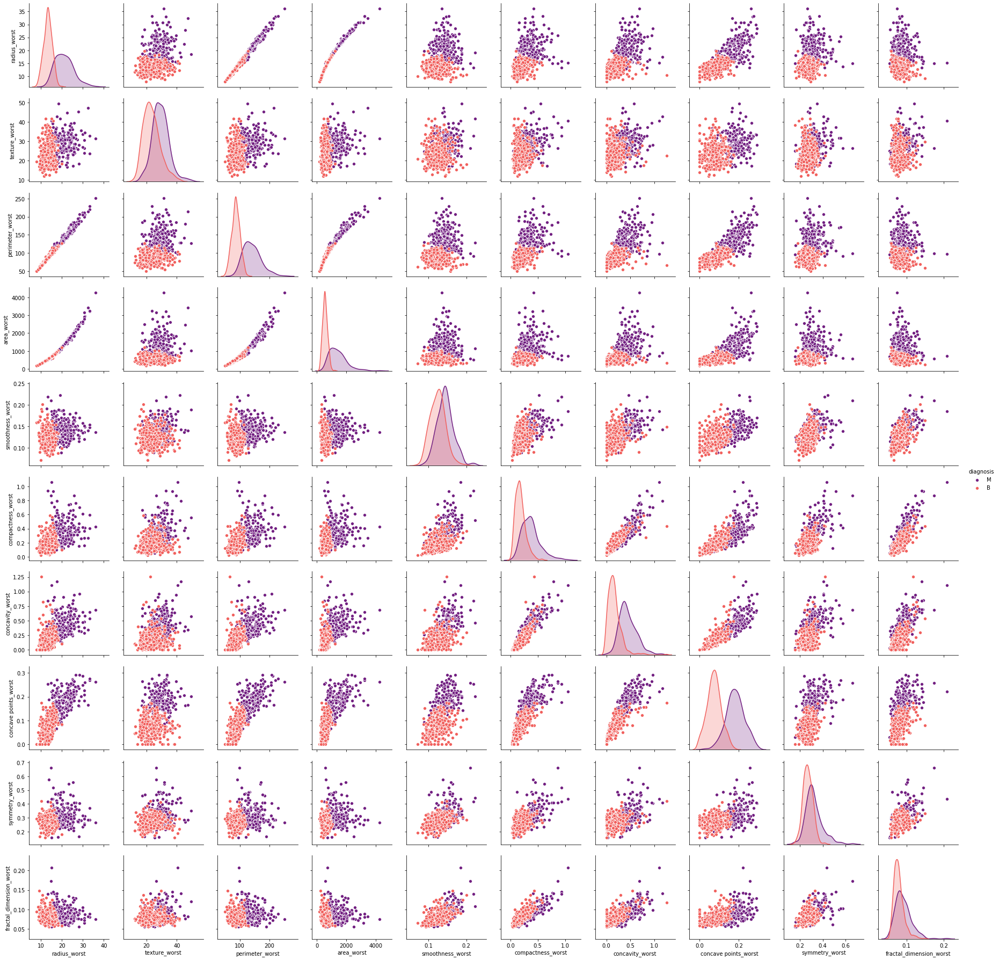

In [89]:
sns.pairplot(data, hue='diagnosis', vars=X_worst, palette='magma')

### To have a different perspective of the data, used the violinplot tool from Seaborn. For this plot to be meaningful, the data has been scaled.

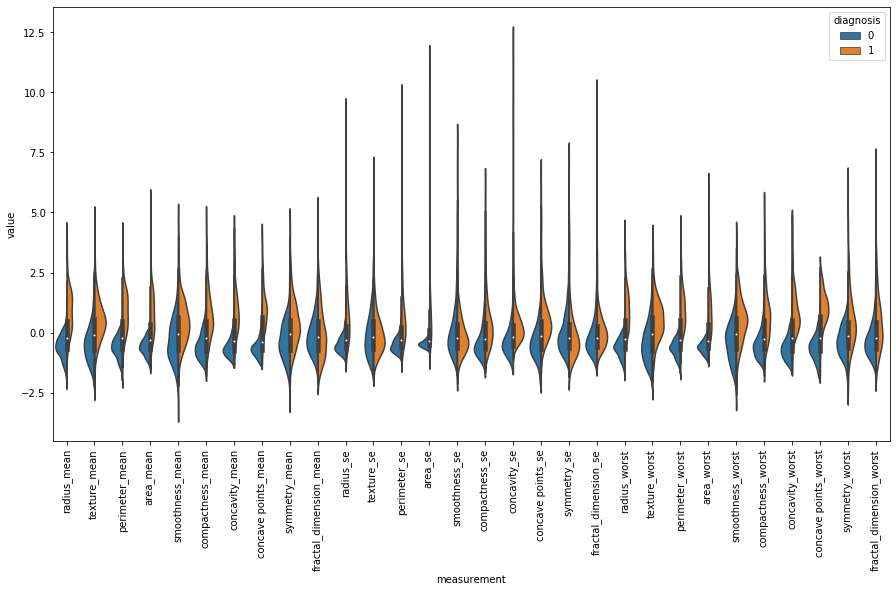

In [90]:
scaled_data_for_violinplot = pd.DataFrame(preprocessing.scale(X))
scaled_data_for_violinplot.columns = X.columns
scaled_data_for_violinplot['diagnosis'] = Y

melted_scaled_data = pd.melt(scaled_data_for_violinplot, 'diagnosis', var_name='measurement')
fig, ax = plt.subplots(figsize=(15,8))
violin_plot = sns.violinplot(ax = ax, x='measurement', y='value', hue='diagnosis', split = True,data=melted_scaled_data);
violin_plot.set_xticklabels(rotation = 90, labels = scaled_data_for_violinplot.columns);

### This tool plot the distributions of the each class back to back. The wider sections of the violin tells us that those values have a higher probability, while the thinner sections tells us the opposite.      
### As you can see in the plots above, the 'worst' feature group has the better distribution. We believe that the 'SE' feature group won't have too much effect on our models' performance due to their weak distributions.

### Lastly, a heatmap which displays numeric tabular data in a visual format where the cells are colored depending upon the contained value.  This enables us to more easily see feature distribution.  There is a trend largely on the diagonal axis again which shows normal distribution between the individual features however beyond that, there is a wide variety of colors.  This could lead to an understanding of which features when working in conjunction could result in various outputs (either M or B).

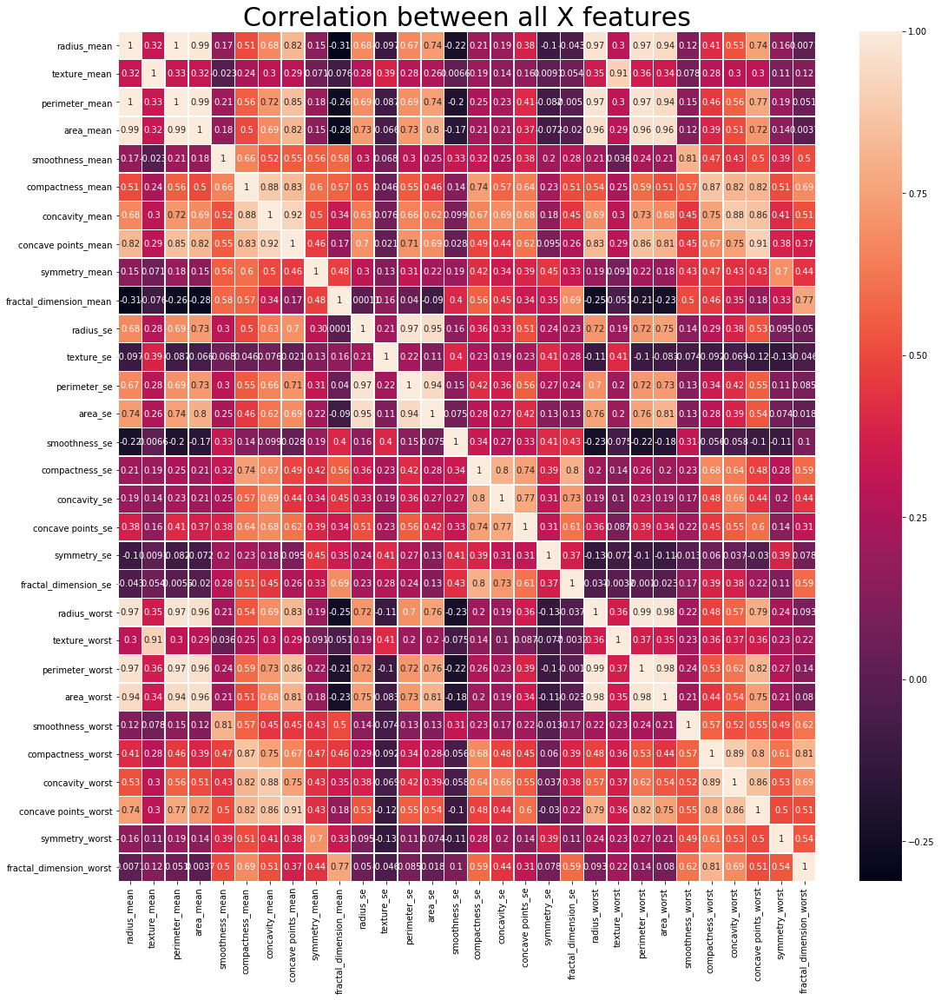

In [91]:
plt.figure(figsize=(18,18))
plt.title('Correlation between all X features', fontsize =30)
sns.heatmap(X.corr(), annot=True, linewidths=.5)

### There were no missing datapoints or NAN values but a few outliers in the data.  The outliers were analyzed and it was determined that since this is a real world dataset collected from actual patients, the outliers would be included in analysis as they could be influential in understanding the data as a whole. 

# 1) KNN

In [92]:
df = pd.read_csv('breast.csv')
df.drop(['id'], axis=1, inplace=True)
df.drop(['Unnamed: 32'], axis=1, inplace=True)

## KNN using all features, unmodified

In [93]:
def cross_validateK(x_train, y_train):
    neighbors = [] 
    cv_scores = []
  
    # perform 10 fold cross validation 
    for k in range(1, 31): 
        neighbors.append(k) 
        knn = KNeighborsClassifier(n_neighbors = k) 
        scores = cross_val_score( 
            knn, x_train, y_train, cv = 10, scoring = 'accuracy') 
        cv_scores.append(scores.mean())
        
    bestK = neighbors[cv_scores.index(np.max(cv_scores))]
    return bestK

In [94]:
diagnosis_type = {'M': 0, 'B': 1}
df.diagnosis = [diagnosis_type[item] for item in df.diagnosis] 
x = df.drop(columns=['diagnosis'])
y = df['diagnosis']

In [95]:
cross_validateK(x, y) #best k for original data = 14

10

In [96]:
knn = KNeighborsClassifier(n_neighbors=cross_validateK(x, y))

skf = StratifiedKFold(n_splits=10)

scores = []
aucs = []


for train_index, test_index in skf.split(x, y):
    x_train, x_test = x.loc[train_index], x.loc[test_index]
    y_train, y_test = y.loc[train_index], y.loc[test_index]
    
    knn.fit(x_train, y_train)
    scores.append(knn.score(x_test, y_test))
    aucs.append(roc_auc_score(y_test, knn.predict(x_test)))
print(np.mean(scores))
print(np.mean(aucs))

0.9315162907268169
0.9212193362193363


In [97]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)
knn = KNeighborsClassifier(n_neighbors=cross_validateK(x_train, y_train))
knn.fit(x_train, y_train)
print(knn.score(x_test, y_test))

0.9298245614035088


## Min-Max Scaling

In [98]:
df_copy = df.copy()
scaler = MinMaxScaler()
features = [[column for column in x.columns]]
for feature in features:
    df_copy[feature] = scaler.fit_transform(df_copy[feature])
x_copy = df_copy.drop(columns=['diagnosis'])
y_copy = df_copy['diagnosis']

In [99]:
knn_scaled = KNeighborsClassifier(n_neighbors=cross_validateK(x_copy, y_copy))

skf = StratifiedKFold(n_splits=10)

scores = []

for train_index, test_index in skf.split(x_copy, y_copy):
    x_train, x_test = x_copy.loc[train_index], x_copy.loc[test_index]
    y_train, y_test = y_copy.loc[train_index], y_copy.loc[test_index]
    
    knn.fit(x_train, y_train)
    scores.append(knn.score(x_test, y_test))    
    #print(confusion_matrix(y_test, knn.predict(x_test)))    
print(np.mean(scores))

0.9701127819548871


In [100]:
#Robust scaling
from sklearn.metrics import recall_score

df_copy = df.copy()
scaler = RobustScaler()
features = [[column for column in x.columns]]
for feature in features:
    df_copy[feature] = scaler.fit_transform(df_copy[feature])
x_copy = df_copy.drop(columns=['diagnosis'])
y_copy = df_copy['diagnosis']

knn_scaled = KNeighborsClassifier(n_neighbors=cross_validateK(x_copy, y_copy))

skf = StratifiedKFold(n_splits=10)

scores = []
aucs = []
recalls_original = []

for train_index, test_index in skf.split(x_copy, y_copy):
    x_train, x_test = x_copy.loc[train_index], x_copy.loc[test_index]
    y_train, y_test = y_copy.loc[train_index], y_copy.loc[test_index]
    
    knn_scaled.fit(x_train, y_train)
    scores.append(knn.score(x_test, y_test))
    aucs.append(roc_auc_score(y_test, knn_scaled.predict(x_test)))
    recalls_original.append(recall_score(y_test, knn_scaled.predict(x_test)))

    #print(confusion_matrix(y_test, knn.predict(x_test)))    
print(np.mean(scores))
print(np.mean(aucs))

0.9613095238095237
0.958023088023088


In [101]:
x_train, x_test, y_train, y_test = train_test_split(x_copy, y_copy, test_size=0.2, random_state=42)
knn_original = KNeighborsClassifier(n_neighbors=cross_validateK(x_train, y_train))
knn_original.fit(x_train, y_train)
print(knn.score(x_test, y_test))

0.956140350877193


## Correlation Heatmap

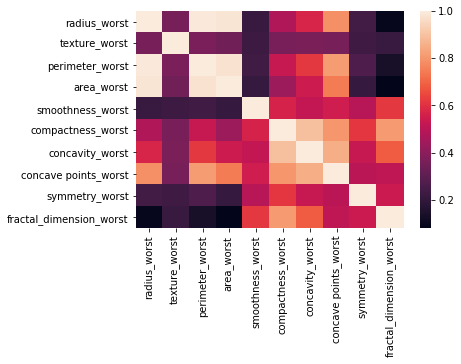

<Figure size 864x1296 with 0 Axes>

In [102]:
#For all the "worst" features

features_worst = ['radius_worst', 'texture_worst', 'perimeter_worst', 'area_worst', 'smoothness_worst', 
            'compactness_worst', 'concavity_worst', 'concave points_worst', 'symmetry_worst', 
            'fractal_dimension_worst']
df_new = df[features_worst]
corr = df_new.corr()
sns.heatmap(corr, fmt='.2f')
fig = plt.figure(figsize=(12,18))

## KNN using all "worst" features

In [103]:
#unscaled
x_worst = df[features_worst]
y_worst = df['diagnosis']

knn_worst = KNeighborsClassifier(n_neighbors=cross_validateK(x_worst, y_worst))
skf = StratifiedKFold(n_splits=10)
scores = []

for train_index, test_index in skf.split(x_worst, y_worst):
    x_train, x_test = x_worst.loc[train_index], x_worst.loc[test_index]
    y_train, y_test = y_worst.loc[train_index], y_worst.loc[test_index]
    
    knn_worst.fit(x_train, y_train)
    scores.append(knn_worst.score(x_test, y_test))    
    #print(confusion_matrix(y_test, knn.predict(x_test)))    
print(np.mean(scores))

0.9227443609022556


In [104]:
#using min-max scaling
x_worst_copy = x_worst.copy()
scaler = MinMaxScaler()
features = [[column for column in x_worst.columns]]
for feature in features:
    x_worst_copy[feature] = scaler.fit_transform(x_worst_copy[feature])
x_copy2 = x_worst_copy
y_copy2 = df['diagnosis']
print(x_copy2.shape)

(569, 10)


In [105]:
#scaled "worst" KNN
knn_worst_scaled = KNeighborsClassifier(n_neighbors=cross_validateK(x_copy2, y_copy2))
skf = StratifiedKFold(n_splits=10)
scores = []

for train_index, test_index in skf.split(x_copy2, y_copy2):
    x_train, x_test = x_copy2.loc[train_index], x_copy2.loc[test_index]
    y_train, y_test = y_copy2.loc[train_index], y_copy2.loc[test_index]
    
    knn_worst.fit(x_train, y_train)
    scores.append(knn_worst.score(x_test, y_test))    
    #print(confusion_matrix(y_test, knn.predict(x_test)))    
print(np.mean(scores))

0.9630952380952381


In [106]:
from sklearn.metrics import confusion_matrix

x_train, x_test, y_train, y_test = train_test_split(x_copy2, y_copy2, test_size=0.2, random_state=42)
knn = KNeighborsClassifier(n_neighbors=cross_validateK(x_train, y_train))
knn.fit(x_train, y_train)
print(knn.score(x_test, y_test))

0.9649122807017544


#### Scaled KNN using worst features performed slightly less than the original with scaling.

## Visualizing to figure out which of select "worst" features are important

In [107]:
df.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,0,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,0,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,0,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,0,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


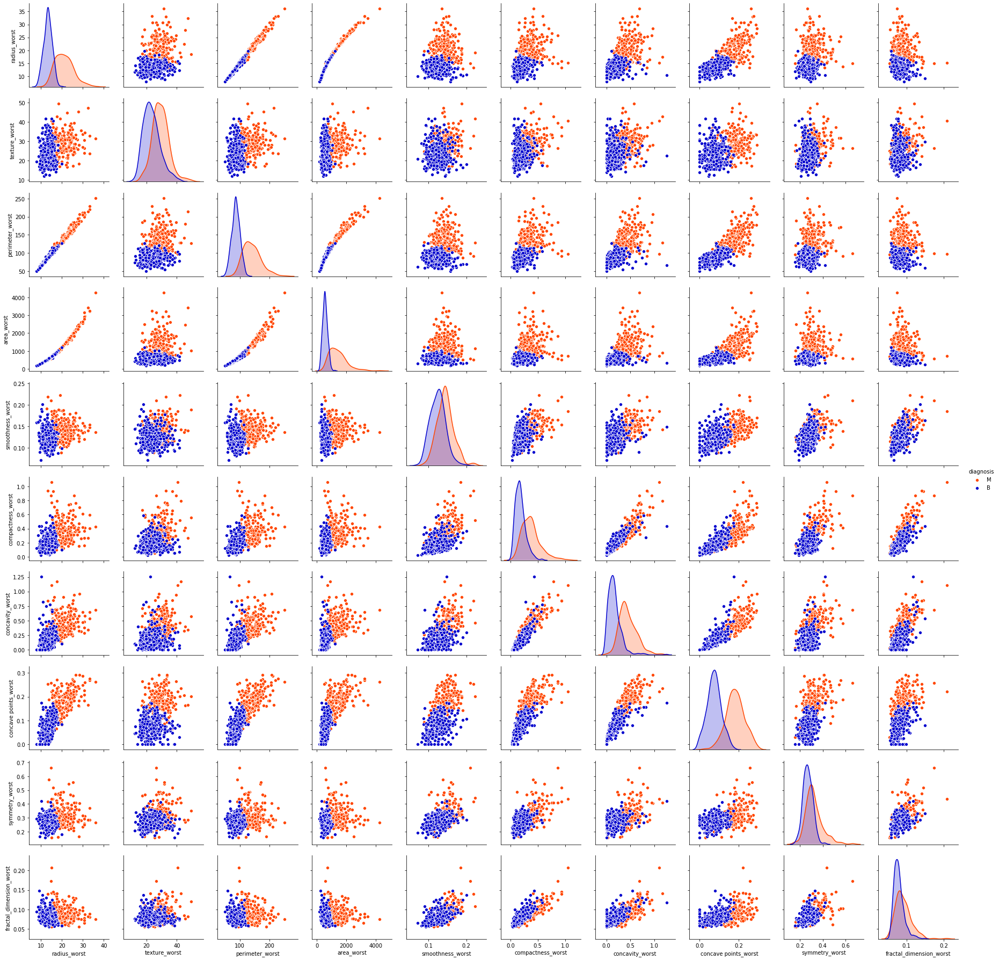

In [108]:
#Using worst features
diagnosis_type = {0: 'M', 1: 'B'}
df.diagnosis = [diagnosis_type[item] for item in df.diagnosis] 
#x = df.drop(columns=['diagnosis'])
#y = df['diagnosis']

color_dict = dict({'M':'orangered','B':'mediumblue',})
sns.pairplot(df, hue = 'diagnosis', vars = features_worst, palette=color_dict)

## Visualizing using radius, #concave points, and texture

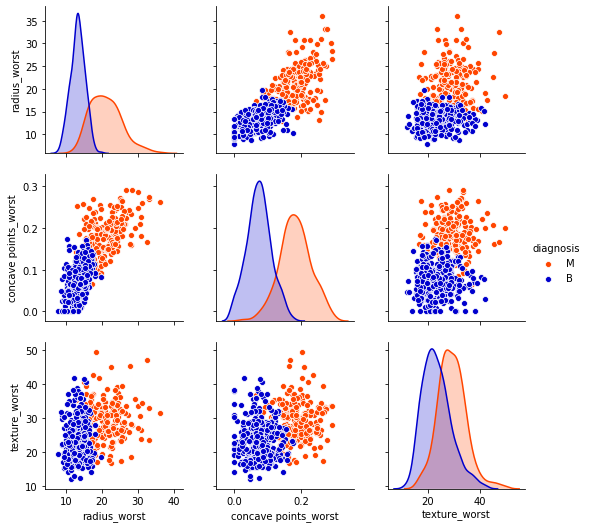

In [109]:
few = ['radius_worst', 'concave points_worst', 'texture_worst']
sns.pairplot(df, hue = 'diagnosis', vars = few, palette=color_dict)

## KNN using radius, concave points, smoothness

In [110]:
#unscaled
select = ['radius_worst', 'concave points_worst', 'smoothness_worst']
x_RT = df[select]
y_RT = df['diagnosis']

knn_worst = KNeighborsClassifier(n_neighbors=cross_validateK(x_RT, y_RT))
skf = StratifiedKFold(n_splits=10)
scores = []

for train_index, test_index in skf.split(x_RT, y_RT):
    x_train, x_test = x_worst.loc[train_index], x_worst.loc[test_index]
    y_train, y_test = y_worst.loc[train_index], y_worst.loc[test_index]
    
    knn_worst.fit(x_train, y_train)
    scores.append(knn_worst.score(x_test, y_test))    
    #print(confusion_matrix(y_test, knn.predict(x_test)))    
print(np.mean(scores))

0.9156954887218044


In [111]:
#scaled
select = ['radius_worst', 'concave points_worst', 'smoothness_worst']
df_copy = df[select].copy()
scaler = MinMaxScaler()
features = [[column for column in df_copy.columns]]
for feature in features:
    df_copy[feature] = scaler.fit_transform(df_copy[feature])
x_copy3 = df_copy
y_copy3 = df['diagnosis']

knn_worst_scaled = KNeighborsClassifier(n_neighbors=cross_validateK(x_copy3, y_copy3))
skf = StratifiedKFold(n_splits=10)
scores = []

for train_index, test_index in skf.split(x_copy3, y_copy3):
    x_train, x_test = x_copy3.loc[train_index], x_copy3.loc[test_index]
    y_train, y_test = y_copy3.loc[train_index], y_copy3.loc[test_index]
    
    knn_worst.fit(x_train, y_train)
    scores.append(knn_worst.score(x_test, y_test))    
    #print(confusion_matrix(y_test, knn.predict(x_test)))    
print(np.mean(scores))

0.9542919799498746


## Using sklearn selectbest, chisq

In [112]:
#Copy the data, encode diagnosis (M=1, B=2)
df_copy = df.copy()
diagnosis_type = {'M': 1, 'B': 2} 
df_copy.diagnosis = [diagnosis_type[item] for item in df_copy.diagnosis]

#Scale data
scaler = MinMaxScaler()
features = [[column for column in df_copy.columns]]
for feature in features:
    df_copy[feature] = scaler.fit_transform(df_copy[feature])
x_copy4 = df_copy.drop(columns=['diagnosis'])
y_copy4 = df['diagnosis']

#Pass to SelectKBest
select_k_best = SelectKBest(chi2, k=2)
x_new = select_k_best.fit_transform(x_copy4, y_copy4)

#KNN
knn_kbest = KNeighborsClassifier(n_neighbors=cross_validateK(x_new, y))
skf = StratifiedKFold(n_splits=10)
scores = []

for train_index, test_index in skf.split(x_new, y):
    x_train, x_test = x_new[train_index], x_new[test_index]
    y_train, y_test = y.loc[train_index], y.loc[test_index]
    
    knn_kbest.fit(x_train, y_train)
    scores.append(knn_kbest.score(x_test, y_test))    
    #print(confusion_matrix(y_test, knn.predict(x_test)))    
print(np.mean(scores))

0.9139411027568922


In [113]:
#Copy the data, encode diagnosis (M=1, B=2)
df_copy = df.copy()
diagnosis_type = {'M': 1, 'B': 2} 
df_copy.diagnosis = [diagnosis_type[item] for item in df_copy.diagnosis]

#Scale data
scaler = MinMaxScaler()
features = [[column for column in df_copy.columns]]
for feature in features:
    df_copy[feature] = scaler.fit_transform(df_copy[feature])
x_copy4 = df_copy.drop(columns=['diagnosis'])
y_copy4 = df['diagnosis']

#Try several different numbers of features
k_best_range = [n for n in range(1, 11)]
mean_scores = {}
for n in k_best_range:
    select_k_best = SelectKBest(chi2, k=n)
    x_new = select_k_best.fit_transform(x_copy4, y_copy4)
    #KNN
    knn_kbest = KNeighborsClassifier(n_neighbors=cross_validateK(x_new, y))
    skf = StratifiedKFold(n_splits=10)
    scores = []

    for train_index, test_index in skf.split(x_new, y):
        x_train, x_test = x_new[train_index], x_new[test_index]
        y_train, y_test = y.loc[train_index], y.loc[test_index]
    
        knn_kbest.fit(x_train, y_train)
        scores.append(knn_kbest.score(x_test, y_test))    
    avg = np.mean(scores)
    mean_scores[n] = avg

In [114]:
mean_scores

{1: 0.9121867167919799,
 2: 0.9139411027568922,
 3: 0.919235588972431,
 4: 0.9438596491228071,
 5: 0.9437969924812031,
 6: 0.9490914786967419,
 7: 0.9455513784461151,
 8: 0.9455513784461151,
 9: 0.9455513784461151,
 10: 0.9455827067669172}

In [115]:
n_features = [n for n in mean_scores.keys()]
score_per_n_features = [n for n in mean_scores.values()]

Text(0.5, 1.0, 'Accuracy per Number of Features Using Selectkbest')

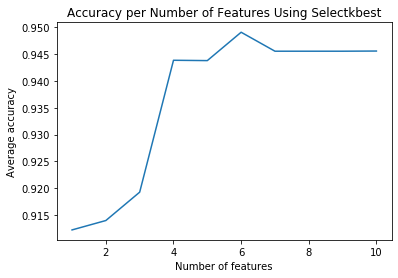

In [116]:
plt.plot(n_features, score_per_n_features)
plt.xlabel('Number of features')
plt.ylabel('Average accuracy')
plt.title('Accuracy per Number of Features Using Selectkbest')

In [117]:
#which are the features selectkbest is using?
select_k_best = SelectKBest(chi2, k=6)
select_k_best.fit_transform(x_copy4, y_copy4)
cols = select_k_best.get_support(indices=True)
features_df_new = x.iloc[:,cols]
features_df_new.columns

Index(['concavity_mean', 'concave points_mean', 'radius_worst',
       'perimeter_worst', 'area_worst', 'concave points_worst'],
      dtype='object')

In [118]:
#choosing 4 features instead bc of multicollinearity
select_k_best = SelectKBest(chi2, k=4)
select_k_best.fit_transform(x_copy4, y_copy4)
cols = select_k_best.get_support(indices=True)
features_df_new = x.iloc[:,cols]
features_df_new.columns

Index(['concavity_mean', 'concave points_mean', 'area_worst',
       'concave points_worst'],
      dtype='object')

In [119]:
#choosing 3 features
select_k_best = SelectKBest(chi2, k=3)
select_k_best.fit_transform(x_copy4, y_copy4)
cols = select_k_best.get_support(indices=True)
features_df_new = x.iloc[:,cols]
features_df_new.columns

Index(['concavity_mean', 'concave points_mean', 'concave points_worst'], dtype='object')

In [120]:
#choosing 1 features
select_k_best = SelectKBest(chi2, k=2)
select_k_best.fit_transform(x_copy4, y_copy4)
cols = select_k_best.get_support(indices=True)
features_df_new = x.iloc[:,cols]
features_df_new.columns

Index(['concave points_mean', 'concave points_worst'], dtype='object')

In [121]:
#k=1 --> concave points_mean

## KNN with worst #concave points, worst area, worst smoothness, and worst texture (scaled)

In [122]:
#scaled
#select = ['concavity_worst', 'area_worst', 'smoothness_worst', 'texture_mean']
select = ['concavity_worst', 'area_worst', 'smoothness_worst', 'texture_mean']
df_copy = df.copy()
diagnosis_type = {'M': 0, 'B': 1} 
df_copy.diagnosis = [diagnosis_type[item] for item in df.diagnosis]
scaler = MinMaxScaler()
#features = [[column for column in df.columns]]
for feature in [select]:
    df_copy[feature] = scaler.fit_transform(df_copy[feature])

x_copy5 = df_copy[select]
y_copy5 = df_copy['diagnosis']

knn_worst_scaled = KNeighborsClassifier(n_neighbors=cross_validateK(x_copy5, y_copy5))
skf = StratifiedKFold(n_splits=10)
scores = []

for train_index, test_index in skf.split(x_copy5, y_copy5):
    x_train, x_test = x_copy5.loc[train_index], x_copy5.loc[test_index]
    y_train, y_test = y_copy5.loc[train_index], y_copy5.loc[test_index]
    
    knn_worst.fit(x_train, y_train)
    scores.append(knn_worst.score(x_test, y_test))    
    #print(confusion_matrix(y_test, knn.predict(x_test)))    
print(np.mean(scores))

0.9525375939849624


In [123]:
#scaled
from sklearn.metrics import roc_curve

"""
#select = ['concavity_worst', 'area_worst', 'smoothness_worst', 'texture_mean']
select = ['concavity_worst', 'area_worst', 'smoothness_worst', 'texture_mean']
df_copy = df[select].copy()
scaler = MinMaxScaler()
features = [[column for column in df_copy.columns]]
for feature in features:
    df_copy[feature] = scaler.fit_transform(df_copy[feature])
x_copy5 = df_copy
y_copy5 = df['diagnosis']
"""
knn_worst_scaled = KNeighborsClassifier(n_neighbors=cross_validateK(x_copy5, y_copy5))
skf = StratifiedKFold(n_splits=10)
scores = []
aucs = []
recalls = []


for train_index, test_index in skf.split(x_copy5, y_copy5):
    x_train, x_test = x_copy5.loc[train_index], x_copy5.loc[test_index]
    y_train, y_test = y_copy5.loc[train_index], y_copy5.loc[test_index]
    
    knn_worst_scaled.fit(x_train, y_train)
    scores.append(knn_worst_scaled.score(x_test, y_test))
    y_pred = knn_worst_scaled.predict(x_test)
    aucs.append(roc_auc_score(y_test, y_pred))
    
    recalls.append(recall_score(y_test, y_pred))

    #print(confusion_matrix(y_test, knn.predict(x_test)))    
print(np.mean(scores))
print(np.mean(aucs))


0.9648182957393484
0.960551948051948


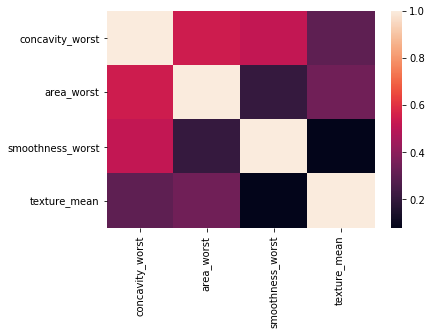

<Figure size 864x1296 with 0 Axes>

In [124]:
#checking multicollinearity of ^ features
df_select = df[select]
corr = df_select.corr()
sns.heatmap(corr, fmt='.2f')
fig = plt.figure(figsize=(12,18))

Text(0, 0.5, 'True positive rate')

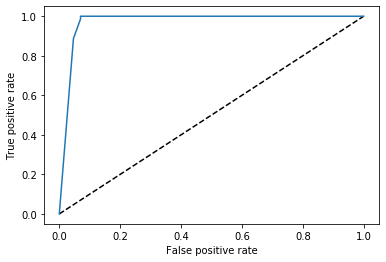

In [125]:
x_train, x_test, y_train, y_test = train_test_split(x_copy5, y_copy5, test_size=0.2, random_state=42)
knn = KNeighborsClassifier(n_neighbors=cross_validateK(x_train, y_train))
knn.fit(x_train, y_train)
knn.score(x_test, y_test)
y_pred_prob = knn.predict_proba(x_test)[:,1]
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)

plt.plot([0,1], [0,1], 'k--')
plt.plot(fpr, tpr, label='ROC Curve for Best KNN')
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')

# 2) SVM

## 2.1) Model without any optimization

#### First we have trained a model, which we didn't perform any preprocessing, feature selection or dimension reduction. This model acts as our baseline to evaluate the improvements after optimizations.

AUC score: 0.958994708994709
Accuracy: 0.9649122807017544
After 10-fold Cross Validation: 0.9418589743589744
              precision    recall  f1-score   support

           0       0.96      0.98      0.97       108
           1       0.97      0.94      0.95        63

    accuracy                           0.96       171
   macro avg       0.97      0.96      0.96       171
weighted avg       0.96      0.96      0.96       171



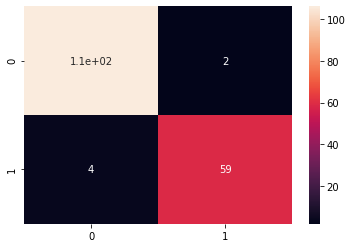

In [126]:
#Training the first model.

X_train_SVM, X_test_SVM, y_train_SVM, y_test_SVM = train_test_split(X, Y, test_size=0.3, random_state=42)

SVC_linear_Model1 = svm.SVC(kernel='linear').fit(X_train_SVM, y_train_SVM)
y_predict_SVM1 = SVC_linear_Model1.predict(X_test_SVM)

cm_SVM = confusion_matrix(y_test_SVM,y_predict_SVM1)
sns.heatmap(cm_SVM,annot=True)


print('AUC score:', roc_auc_score(y_test_SVM, y_predict_SVM1))
print('Accuracy:', accuracy_score(y_test_SVM, y_predict_SVM1))
print('After 10-fold Cross Validation:', np.mean(cross_val_score(SVC_linear_Model1, X_train_SVM, y_train_SVM, cv=10)))
model11 = np.mean(cross_val_score(SVC_linear_Model1, X_train_SVM, y_train_SVM, cv=10))
print(classification_report(y_test_SVM,y_predict_SVM1))

### GridSearch to select the best parameters for SVM model.Since the dataset hasn't been scaled yet, this process takes a little time.

In [127]:
tuned_parameters_SVM = [{'kernel': ['linear'], 'gamma': [1,0.1,0.01,0.001, 0.0001],'C': [0.1, 1, 10, 100, 1000, 10000]}]

grid_SVM1 = GridSearchCV(svm.SVC(), tuned_parameters_SVM, n_jobs=-1).fit(X_train_SVM, y_train_SVM)

print('Best parameters:')
print(grid_SVM1.best_params_)
print(grid_SVM1.best_estimator_)

Best parameters:
{'C': 10, 'gamma': 1, 'kernel': 'linear'}
SVC(C=10, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma=1, kernel='linear',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)


AUC Score: 0.958994708994709
Accuracy: 0.9649122807017544
After 10-fold Cross Validation: 0.954551282051282
              precision    recall  f1-score   support

           0       0.96      0.98      0.97       108
           1       0.97      0.94      0.95        63

    accuracy                           0.96       171
   macro avg       0.97      0.96      0.96       171
weighted avg       0.96      0.96      0.96       171



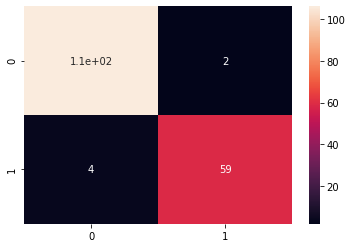

In [128]:
# After the best parameter selection, we run our model.

SVC_linear_Model1_grid1 = svm.SVC(C=10, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma=1, kernel='linear',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False).fit(X_train_SVM, y_train_SVM)
y_predict_SVM1_grid1 = SVC_linear_Model1.predict(X_test_SVM)

cm_SVM1_grid1 = confusion_matrix(y_test_SVM,y_predict_SVM1_grid1)
sns.heatmap(cm_SVM1_grid1,annot=True)

print('AUC Score:', roc_auc_score(y_test_SVM, y_predict_SVM1_grid1))
print('Accuracy:', accuracy_score(y_test_SVM, y_predict_SVM1_grid1))
model12 = cross_val_score(SVC_linear_Model1_grid1, X_train_SVM, y_train_SVM, cv=10)
print('After 10-fold Cross Validation:', np.mean(model12))
print(classification_report(y_test_SVM,y_predict_SVM1_grid1))

### As you can see, there is no difference between 'the model with no parameters' and 'the model with the best parameters'. 10-fold cross validation score is the only difference which is slightly increased for the model with the best parameters.
### Next step was model improvement. The goal was to get the highest possible accuracy with the minimum number of features. Firstly, the data was scaled. Since the features were corralated, we used PCA to reduce the dimension and get rid of the correlation which might cause overfitting. 

## 2.2) Model with all the features and PCA applied. Best parameters are found by GridSearch.

In [129]:
#Scaling the data

scaler_1 = MinMaxScaler().fit(X)
X_train_SVM_scaled1 = scaler_1.transform(X_train_SVM)
X_test_SVM_scaled1 = scaler_1.transform(X_test_SVM)

99% point:  15


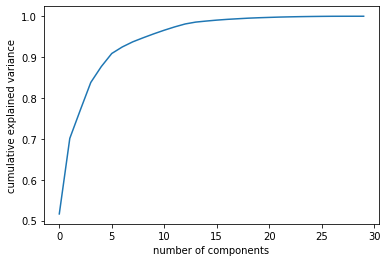

In [130]:
#Which component should we choose?

pca_test1 = PCA().fit(X_train_SVM_scaled1)
plt.plot(np.cumsum(pca_test1.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance');
number_of_components = np.argmax(np.cumsum(pca_test1.explained_variance_ratio_) >0.99)
print("99% point: ", number_of_components)

In [131]:
PCA_1 = PCA(n_components=15).fit(X_train_SVM_scaled1)
X_train_SVM_scaled1_PCA1 = PCA_1.transform(X_train_SVM_scaled1)
X_test_SVM_scaled1_PCA1 = PCA_1.transform(X_test_SVM_scaled1)

#### After component selection, we applied PCA. You can observe the first two components, and how they are distributed well after PCA.

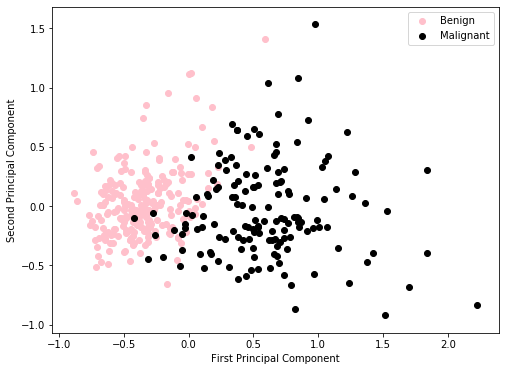

In [132]:
labels=y_train_SVM
colors={0:'pink',1:'black'}
legends={0:'Benign', 1:'Malignant'}
fig,ax=plt.subplots(figsize=(8,6))

for i in np.unique(labels):
    ix=np.where(labels==i)
    ax.scatter(X_train_SVM_scaled1_PCA1[:, 0][ix],X_train_SVM_scaled1_PCA1[:, 1][ix],c=colors[i], label=legends[i])


plt.xlabel('First Principal Component') 
plt.ylabel('Second Principal Component')
plt.legend()
plt.show()

#### Scaling the data might change the best parameters for model. Therefore, after scaling the data, we used GridSearch to select the best parameters again.

In [133]:
grid_SVM2 = GridSearchCV(svm.SVC(), tuned_parameters_SVM, n_jobs=-1)
grid_SVM2 = grid_SVM2.fit(X_train_SVM_scaled1_PCA1, y_train_SVM)

print('Best parameters:')
print(grid_SVM2.best_params_)
print(grid_SVM2.best_estimator_)

Best parameters:
{'C': 10, 'gamma': 1, 'kernel': 'linear'}
SVC(C=10, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma=1, kernel='linear',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)


AUC Score: 0.9794973544973545
Accuracy: 0.9824561403508771
After 10-fold Cross Validation: 0.954551282051282
              precision    recall  f1-score   support

           0       0.98      0.99      0.99       108
           1       0.98      0.97      0.98        63

    accuracy                           0.98       171
   macro avg       0.98      0.98      0.98       171
weighted avg       0.98      0.98      0.98       171



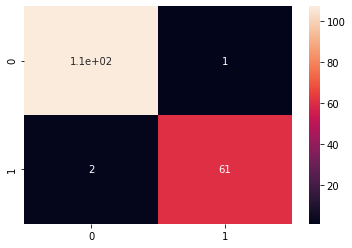

In [134]:
SVC_linear_Model2_grid2 = svm.SVC(C=10, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma=1, kernel='linear',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False).fit(X_train_SVM_scaled1_PCA1, y_train_SVM)

y_predict_SVM2_grid2 = SVC_linear_Model2_grid2.predict(X_test_SVM_scaled1_PCA1)
cm_SVM2_grid2 = confusion_matrix(y_test_SVM,y_predict_SVM2_grid2)
sns.heatmap(cm_SVM2_grid2,annot=True)
print('AUC Score:' , roc_auc_score(y_test_SVM,y_predict_SVM2_grid2))
print('Accuracy:', accuracy_score(y_test_SVM, y_predict_SVM2_grid2))
model2 = np.mean(cross_val_score(SVC_linear_Model2_grid2, X_train_SVM, y_train_SVM, cv=10, n_jobs=-1))
print('After 10-fold Cross Validation:', np.mean(model2))
print(classification_report(y_test_SVM,y_predict_SVM2_grid2))

## 2.3) Model with selected features and PCA applied, and the best parameters found by GridSearch

### Feature Selection

In [135]:
scaler_2 = MinMaxScaler().fit_transform(X)

selector = SelectKBest(chi2, k=4)
X_selected = selector.fit_transform(scaler_2, Y)

cols = selector.get_support(indices=True)
features_df_new = X.iloc[:,cols]
features_df_new.corr()

,concavity_mean,concave points_mean,area_worst,concave points_worst
concavity_mean,1.000000,0.921391,0.675987,0.861323
concave points_mean,0.921391,1.000000,0.809630,0.910155
area_worst,0.675987,0.809630,1.000000,0.747419
concave points_worst,0.861323,0.910155,0.747419,1.000000


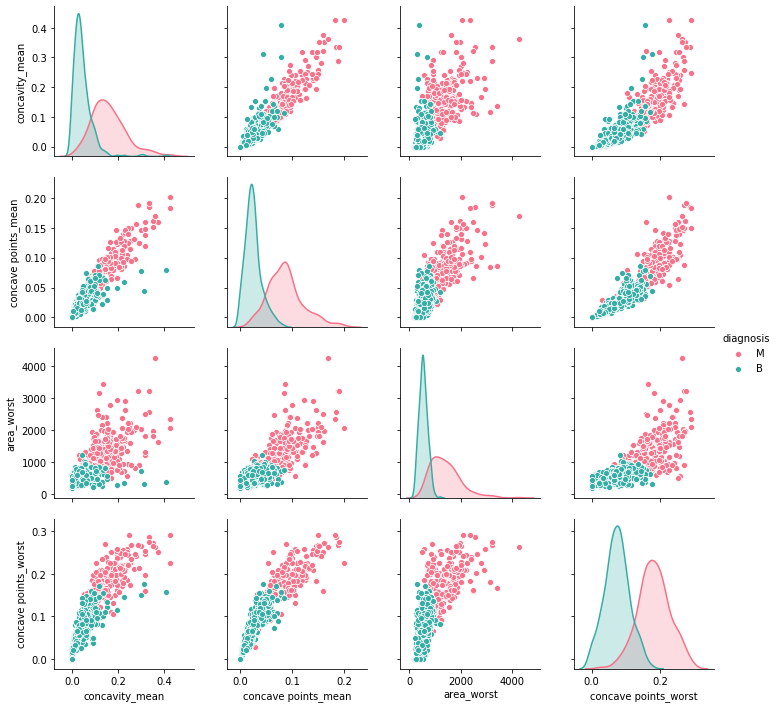

In [136]:
sns.pairplot(data, hue='diagnosis', vars=features_df_new.columns, palette='husl')

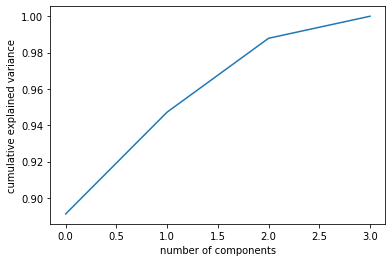

In [137]:
pca_test2 = PCA().fit(X_selected)
plt.plot(np.cumsum(pca_test2.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance');

In [139]:

X_train_selected_SVM_scaled2, X_test_selected_SVM_scaled2, y_train_SVM, y_test_SVM = train_test_split(X_selected, Y, test_size=0.3, random_state=42)

PCA_2 = PCA(n_components=4).fit(X_train_selected_SVM_scaled2)
X_train_selected_SVM_scaled2_PCA2 = PCA_2.transform(X_train_selected_SVM_scaled2)
X_test_selected_SVM_scaled2_PCA2 = PCA_2.transform(X_test_selected_SVM_scaled2)

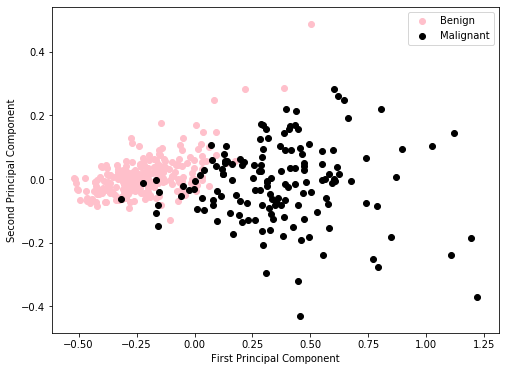

In [140]:
labels=y_train_SVM
colors={0:'pink',1:'black'}
legends={0:'Benign', 1:'Malignant'}
fig,ax=plt.subplots(figsize=(8,6))

for i in np.unique(labels):
    ix=np.where(labels==i)
    ax.scatter(X_train_selected_SVM_scaled2_PCA2[:, 0][ix],X_train_selected_SVM_scaled2_PCA2[:, 1][ix],c=colors[i], label=legends[i])

plt.xlabel('First Principal Component') 
plt.ylabel('Second Principal Component')
plt.legend()
plt.show()

In [141]:
grid_SVM_3 = GridSearchCV(svm.SVC(), tuned_parameters_SVM, n_jobs=-1)
grid_SVM_3 = grid_SVM_3.fit(X_train_selected_SVM_scaled2_PCA2, y_train_SVM)

print('Best parameters:')
print(grid_SVM_3.best_params_)
print(grid_SVM_3.best_estimator_)

Best parameters:
{'C': 100, 'gamma': 1, 'kernel': 'linear'}
SVC(C=100, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma=1, kernel='linear',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)


AUC Score: 0.9702380952380952
Accuracy: 0.9707602339181286
After 10-fold Cross Validation: 0.9671794871794871
              precision    recall  f1-score   support

           0       0.98      0.97      0.98       108
           1       0.95      0.97      0.96        63

    accuracy                           0.97       171
   macro avg       0.97      0.97      0.97       171
weighted avg       0.97      0.97      0.97       171



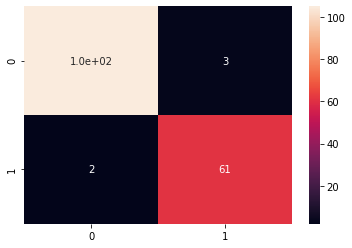

In [142]:
SVC_linear_Model3_grid3 = svm.SVC(C=1000, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma=1, kernel='linear',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False).fit(X_train_selected_SVM_scaled2_PCA2, y_train_SVM)

y_predict_SVM3_grid3 = SVC_linear_Model3_grid3.predict(X_test_selected_SVM_scaled2_PCA2)

cm_SVM3_grid3 = confusion_matrix(y_test_SVM,y_predict_SVM3_grid3)
sns.heatmap(cm_SVM3_grid3,annot=True)
model3 = cross_val_score(SVC_linear_Model3_grid3, X_train_SVM, y_train_SVM, cv=10, n_jobs=-1)

print('AUC Score:' , roc_auc_score(y_test_SVM,y_predict_SVM3_grid3))
print('Accuracy:', accuracy_score(y_test_SVM, y_predict_SVM3_grid3))
print('After 10-fold Cross Validation:', np.mean(model3))
print(classification_report(y_test_SVM,y_predict_SVM3_grid3))

Text(0.5, 1.0, 'ROC Curve of SVM model with 4 Features')

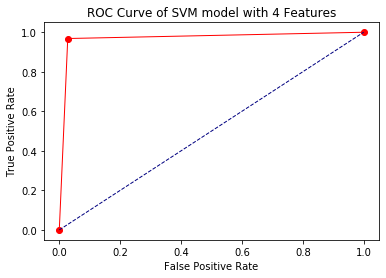

In [143]:
fpr, tpr, thresholds = metrics.roc_curve(y_test_SVM,y_predict_SVM3_grid3)
plt.plot(fpr, tpr, 'ro-', lw=1)
plt.plot([0, 1], [0, 1], color='navy', lw=1, linestyle='--')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.title('ROC Curve of SVM model with 4 Features')

# 2.4) Three features were selected after analyzing the data visualizations.

In [144]:
X_selected2 = X[['area_worst','texture_worst','concave points_worst']]

In [145]:
X_selected2.corr()

,area_worst,texture_worst,concave points_worst
area_worst,1.000000,0.345842,0.747419
texture_worst,0.345842,1.000000,0.359755
concave points_worst,0.747419,0.359755,1.000000


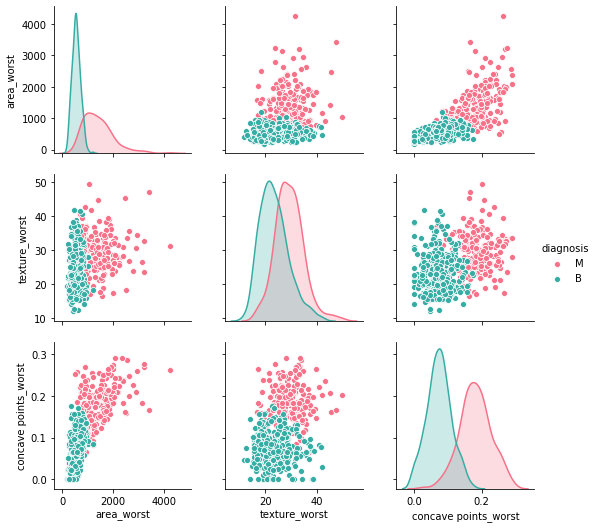

In [146]:
sns.pairplot(data, hue='diagnosis', vars=X_selected2.columns, palette='husl')

In [147]:
scaler_2 = RobustScaler().fit_transform(X_selected2)
X_train_selected_SVM_scaled3, X_test_selected_SVM_scaled3, y_train_SVM, y_test_SVM = train_test_split(scaler_2, Y, test_size=0.3, random_state=42)

AUC Score: 0.966931216931217
Accuracy: 0.9707602339181286
After 10-fold Cross Validation: 0.9671794871794871
              precision    recall  f1-score   support

           0       0.97      0.98      0.98       108
           1       0.97      0.95      0.96        63

    accuracy                           0.97       171
   macro avg       0.97      0.97      0.97       171
weighted avg       0.97      0.97      0.97       171



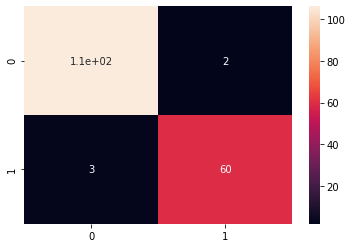

In [148]:
SVC_linear_Model4 = svm.SVC(C=1000, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma=1, kernel='linear',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False).fit(X_train_selected_SVM_scaled3, y_train_SVM)

y_predict_SVM4 = SVC_linear_Model4.predict(X_test_selected_SVM_scaled3)
cm_SVM4 = confusion_matrix(y_test_SVM,y_predict_SVM4)
sns.heatmap(cm_SVM4,annot=True)
model4=cross_val_score(SVC_linear_Model4, X_train_SVM, y_train_SVM, cv=10, n_jobs=-1)

print('AUC Score:' , roc_auc_score(y_test_SVM,y_predict_SVM4))
print('Accuracy:', accuracy_score(y_test_SVM, y_predict_SVM4))
print('After 10-fold Cross Validation:', np.mean(model4))
print(classification_report(y_test_SVM,y_predict_SVM4))

Text(0.5, 1.0, 'ROC Curve of SVM model with 3 Features')

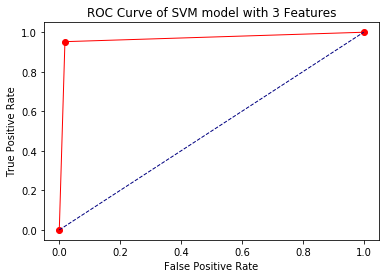

In [149]:
fpr, tpr, thresholds = metrics.roc_curve(y_test_SVM,y_predict_SVM4)
plt.plot(fpr, tpr, 'ro-', lw=1)
plt.plot([0, 1], [0, 1], color='navy', lw=1, linestyle='--')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.title('ROC Curve of SVM model with 3 Features')

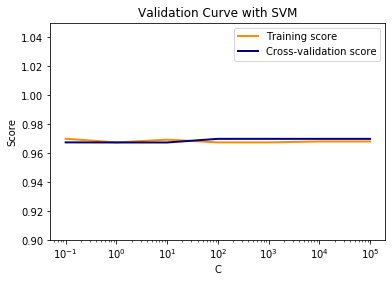

In [150]:
parameters_C = [0.1,1,10,100,1000,10000,100000]

train_scores, test_scores = validation_curve(SVC(kernel='linear'), X_train_selected_SVM_scaled3, y_train_SVM, param_name='C',
                                             param_range=parameters_C,scoring="accuracy", n_jobs=1)

train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

plt.title("Validation Curve with SVM")
plt.xlabel("C")
plt.ylabel("Score")
plt.ylim(0.9, 1.05)
lw = 2
plt.semilogx(parameters_C, train_scores_mean, label="Training score",color="darkorange", lw=lw)
plt.semilogx(parameters_C, test_scores_mean, label="Cross-validation score",color="navy", lw=lw)

plt.legend()
plt.show()

Text(0.5, 1.0, 'Model Improvement')

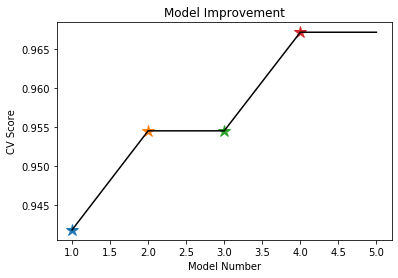

In [151]:
f, diagram = plt.subplots(1)

Score_x = [np.mean(model11), np.mean(model12), np.mean(model2), np.mean(model3), np.mean(model4)]
Model_y = [1,2,3,4,5]
for i in range(4):
    yPoint =  Score_x[i]
    xPoint =  Model_y[i]
    diagram.plot(xPoint, yPoint, '*',markersize=12)

plt.plot(Model_y,Score_x, 'k')
plt.ylabel('CV Score')
plt.xlabel('Model Number')
plt.title('Model Improvement')

# 3) XGB

In [152]:
#setting up the data

data = pd.read_csv('breast.csv', index_col = 0, sep = ',', header=0)
data.drop('Unnamed: 32', axis=1, inplace=True)
data.head()
data['diagnosis'].unique()
diagnosis_mapping = {"M": 0, "B": 1}
data['diagnosis'] = data['diagnosis'].map(diagnosis_mapping)

In [153]:
y = data['diagnosis']
x = data.drop(['diagnosis'], axis=1)

n_classes = 2
random_state= 101

X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=random_state)

scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train)

X_test = scaler.transform(X_test)

In [154]:
model_performance = []
#XGB with no specifications
classifier_type = [XGBClassifier]
model_name = str(classifier_type)

model = XGBClassifier()
model.fit(X_train, y_train)
predictions_1 = model.predict(X_test)
print(XGBClassifier,':- ') 
print(classification_report(y_test,predictions_1))
print('-------------------------------------------------------------')

<class 'xgboost.sklearn.XGBClassifier'> :- 
              precision    recall  f1-score   support

           0       1.00      0.98      0.99        42
           1       0.99      1.00      0.99        72

    accuracy                           0.99       114
   macro avg       0.99      0.99      0.99       114
weighted avg       0.99      0.99      0.99       114

-------------------------------------------------------------


In [158]:
from sklearn.metrics import accuracy_score, f1_score, fbeta_score, make_scorer

In [159]:
acc = accuracy_score(y_test,predictions_1)
f1_score_1 = f1_score(y_test,predictions_1)
recall = recall_score(y_test,predictions_1)
precision = precision_score(y_test,predictions_1)
Results = pd.DataFrame(columns=['Model Name', 'Accuracy', 'F1 Score', 'Recall', 'Precision'])
Results = Results.append({'Model Name': 'XGBoost', 'Accuracy': acc, 'F1 Score': f1_score_1, 'Recall': recall, 'Precision': precision }, ignore_index=True)
Results = Results.sort_values('Accuracy', ascending=False)
Results = Results.reset_index(drop=True)
Results

,Model Name,Accuracy,F1 Score,Recall,Precision
0,XGBoost,0.991228,0.993103,1.0,0.986301


AUC: 0.988


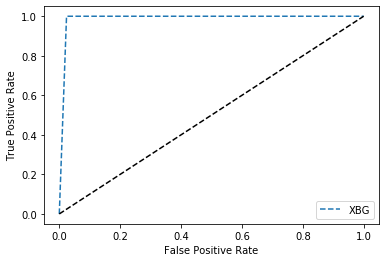

In [160]:

fpr, tpr, thresholds = roc_curve(y_test, predictions_1)
auc = roc_auc_score(y_test, predictions_1)
print('AUC: %.3f' % auc)
plt.plot(fpr, tpr, linestyle='--', label='XBG')
plt.plot([0,1], [0,1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.show()

In [161]:
#XGB with 5 fold cross-validation
clf_xgb = XGBClassifier(objective = 'binary:logistic')
param_dist = {'n_estimators': [400],
              'learning_rate': [.10, .01, .001, .001],
              'max_depth': [3, 4, 5, 6, 7, 8, 9],
              'min_child_weight': [1, 2, 3, 4]
             }

clf = RandomizedSearchCV(clf_xgb, 
                         param_distributions = param_dist,
                         n_iter = 5, 
                         scoring = 'roc_auc', 
                         error_score = 0, 
                         verbose = 3, 
                         n_jobs = -1)

clf.fit(X_train, y_train)
predictions_2 = clf.predict(X_test)

print(classification_report(y_test,predictions_2))

acc_2 = accuracy_score(y_test,predictions_2)
f1_score_2 = f1_score(y_test,predictions_2)
recall_2 = recall_score(y_test,predictions_2)
precision_2 = precision_score(y_test,predictions_2)
Results_2 = pd.DataFrame(columns=['Model Name', 'Accuracy', 'F1 Score', 'Recall', 'Precision'])
Results_2 = Results_2.append({'Model Name': 'XGBoost', 'Accuracy': acc_2, 'F1 Score': f1_score_2, 'Recall': recall_2, 'Precision': precision_2 }, ignore_index=True)
Results_2 = Results_2.sort_values('Accuracy', ascending=False)
Results_2 = Results_2.reset_index(drop=True)
Results_2

Fitting 5 folds for each of 5 candidates, totalling 25 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  19 out of  25 | elapsed:    4.4s remaining:    1.3s


              precision    recall  f1-score   support

           0       1.00      0.95      0.98        42
           1       0.97      1.00      0.99        72

    accuracy                           0.98       114
   macro avg       0.99      0.98      0.98       114
weighted avg       0.98      0.98      0.98       114



[Parallel(n_jobs=-1)]: Done  25 out of  25 | elapsed:    5.1s finished


,Model Name,Accuracy,F1 Score,Recall,Precision
0,XGBoost,0.982456,0.986301,1.0,0.972973


Text(0.5, 1.0, 'XGBClassifier Estimated Feature Importance')

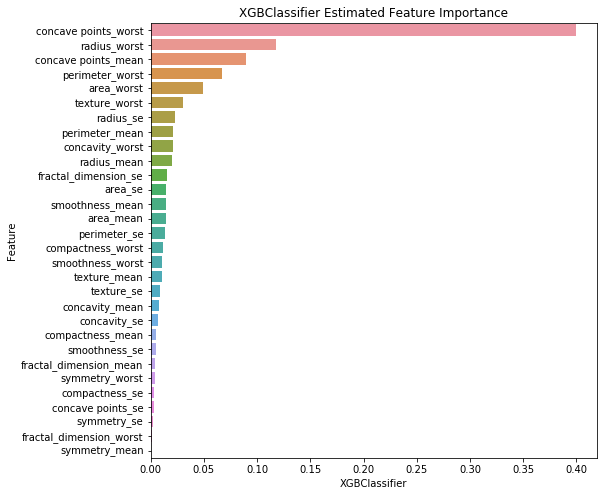

In [162]:
#Identifying the Most important features
relative_importance = clf.best_estimator_.feature_importances_
relative_importance = relative_importance / np.sum(relative_importance)
features = x.columns
feature_importance =\
    pd.DataFrame(list(zip(features,
                          relative_importance)),
                 columns=['feature', 'relativeimportance'])

feature_importance = feature_importance.sort_values('relativeimportance',
                                                    ascending=False)

feature_importance = feature_importance.reset_index(drop=True)

plt.figure(figsize=(8, 8))
sns.barplot(x='relativeimportance',
            y='feature',
            data=feature_importance)
plt.xlabel('XGBClassifier')
plt.ylabel('Feature')
plt.title('XGBClassifier Estimated Feature Importance')

In [163]:
#Using top 6 features
y = data['diagnosis']
x = data.drop(['diagnosis'], axis=1)
x_new = data[['concave points_worst', 'concave points_mean', 'area_worst', 'perimeter_worst', 
             'radius_worst', 'texture_worst']]
X_train_new, X_test_new, y_train_new, y_test_new = train_test_split(x_new, y, test_size=0.2, random_state=random_state)
scaler = MinMaxScaler()
X_train_new = scaler.fit_transform(X_train_new)

X_test_new = scaler.transform(X_test_new)
model_performance = []

classifier_type = [XGBClassifier]
model_name = str(classifier_type)

model = XGBClassifier()
model.fit(X_train_new, y_train_new)
predictions_new = model.predict(X_test_new)
print(XGBClassifier,':- ') 
print(classification_report(y_test_new,predictions_new))
print('-------------------------------------------------------------')

acc_new = accuracy_score(y_test_new,predictions_new)
f1_score_new = f1_score(y_test_new,predictions_new)
recall_new = recall_score(y_test_new,predictions_new)
precision_new = precision_score(y_test_new,predictions_new)
Results_new = pd.DataFrame(columns=['Model Name', 'Accuracy', 'F1 Score', 'Recall', 'Precision'])
Results_new = Results_new.append({'Model Name': 'XGBoost', 'Accuracy': acc_new, 'F1 Score': f1_score_new, 'Recall': recall_new, 'Precision': precision_new }, ignore_index=True)
Results_new = Results_new.sort_values('Accuracy', ascending=False)
Results_new = Results_new.reset_index(drop=True)
Results_new

<class 'xgboost.sklearn.XGBClassifier'> :- 
              precision    recall  f1-score   support

           0       1.00      0.95      0.98        42
           1       0.97      1.00      0.99        72

    accuracy                           0.98       114
   macro avg       0.99      0.98      0.98       114
weighted avg       0.98      0.98      0.98       114

-------------------------------------------------------------


,Model Name,Accuracy,F1 Score,Recall,Precision
0,XGBoost,0.982456,0.986301,1.0,0.972973


AUC: 0.976


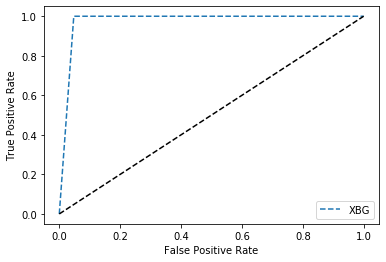

In [164]:
fpr_new, tpr_new, thresholds = roc_curve(y_test_new, predictions_new)
auc_new = roc_auc_score(y_test_new, predictions_new)
print('AUC: %.3f' % auc_new)
plt.plot(fpr_new, tpr_new, linestyle='--', label='XBG')
plt.plot([0,1], [0,1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.show()

In [165]:
#Finding the misclassified Data
print(np.array(predictions_new) == np.array(y_test_new))
(predictions_new==y_test_new).all()
print(predictions_new[89])
print(y_test_new.iloc[89])
pd.set_option("display.max.rows", None)
pd.set_option("display.max.columns", None)
# y_test_new
#id number: 913535

[ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True False  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True False  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True]
1
0


In [166]:
#Using top 4 features
y = data['diagnosis']
x = data.drop(['diagnosis'], axis=1)
x_4 = data[['concave points_worst', 'concave points_mean', 'area_worst', 'perimeter_worst']]
X_train_4, X_test_4, y_train_4, y_test_4 = train_test_split(x_4, y, test_size=0.2, random_state=random_state)
scaler = MinMaxScaler()
X_train_4 = scaler.fit_transform(X_train_4)
X_test_4 = scaler.transform(X_test_4)
model_performance = []
classifier_type = [XGBClassifier]
model_name = str(classifier_type)
model = XGBClassifier()
model.fit(X_train_4, y_train_4)
predictions_4 = model.predict(X_test_4)
print(XGBClassifier,':- ') 
print(classification_report(y_test_4,predictions_4))
print('-------------------------------------------------------------')

acc_4 = accuracy_score(y_test_4,predictions_4)
f1_score_4 = f1_score(y_test_4,predictions_4)
recall_4 = recall_score(y_test_4,predictions_4)
precision_4 = precision_score(y_test_new,predictions_new)
Results_4 = pd.DataFrame(columns=['Model Name', 'Accuracy', 'F1 Score', 'Recall', 'Precision'])
Results_4 = Results_4.append({'Model Name': 'XGBoost', 'Accuracy': acc_4, 'F1 Score': f1_score_4, 'Recall': recall_4, 'Precision': precision_4 }, ignore_index=True)
Results_4 = Results_4.sort_values('Accuracy', ascending=False)
Results_4 = Results_4.reset_index(drop=True)
Results_4

<class 'xgboost.sklearn.XGBClassifier'> :- 
              precision    recall  f1-score   support

           0       0.93      0.93      0.93        42
           1       0.96      0.96      0.96        72

    accuracy                           0.95       114
   macro avg       0.94      0.94      0.94       114
weighted avg       0.95      0.95      0.95       114

-------------------------------------------------------------


,Model Name,Accuracy,F1 Score,Recall,Precision
0,XGBoost,0.947368,0.958333,0.958333,0.972973


AUC: 0.943


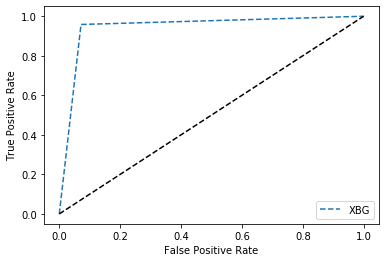

In [167]:
fpr_4, tpr_4, thresholds = roc_curve(y_test_4, predictions_4)
auc_4 = roc_auc_score(y_test_4, predictions_4)
print('AUC: %.3f' % auc_4)
plt.plot(fpr_4, tpr_4, linestyle='--', label='XBG')
plt.plot([0,1], [0,1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.show()